<a href="https://colab.research.google.com/github/MatthewMoore01/PongWars/blob/main/classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [7]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)
data_dir = '/content/drive/MyDrive/MscProject/images2'

ModuleNotFoundError: No module named 'imp'

In [1]:
# !pip install pillow

# !pip install pyheif

# !pip install imageio[ffmpeg]

In [2]:
# import tensorflow as tf
# import pathlib
# import os

# data_dir = pathlib.Path('/content/drive/MyDrive/MscProject/images')
# output_dir = pathlib.Path('/content/drive/MyDrive/MscProject/images4')

# # Create output directory if it doesn't exist
# output_dir.mkdir(parents=True, exist_ok=True)

# for class_name in ['Negative', 'Positive']:
#   class_dir = data_dir / class_name
#   output_class_dir = output_dir / class_name
#   output_class_dir.mkdir(exist_ok=True)

#   for image_path in xclass_dir.glob('*.jpg'):
#     image = tf.io.read_file(str(image_path))
#     image = tf.image.decode_jpeg(image, channels=3)
#     image = tf.image.resize(image, [720, 720])
#     output_path = output_class_dir / image_path.name
#     tf.io.write_file(str(output_path), tf.image.encode_jpeg(tf.cast(image, tf.uint8)))

KeyboardInterrupt: 

<table class="tfo-notebook-buttons" align="left">
  <td>
    <a target="_blank" href="https://www.tensorflow.org/tutorials/images/classification"><img src="https://www.tensorflow.org/images/tf_logo_32px.png" />View on TensorFlow.org</a>
  </td>
  <td>
    <a target="_blank" href="https://colab.research.google.com/github/tensorflow/docs/blob/master/site/en/tutorials/images/classification.ipynb"><img src="https://www.tensorflow.org/images/colab_logo_32px.png" />Run in Google Colab</a>
  </td>
  <td>
    <a target="_blank" href="https://github.com/tensorflow/docs/blob/master/site/en/tutorials/images/classification.ipynb"><img src="https://www.tensorflow.org/images/GitHub-Mark-32px.png" />View source on GitHub</a>
  </td>
  <td>
    <a href="https://storage.googleapis.com/tensorflow_docs/docs/site/en/tutorials/images/classification.ipynb"><img src="https://www.tensorflow.org/images/download_logo_32px.png" />Download notebook</a>
  </td>
</table>

## Setup

Import TensorFlow and other necessary libraries:

In [3]:
import matplotlib.pyplot as plt
import numpy as np
import PIL
import tensorflow as tf
import datetime
import os

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

%load_ext tensorboard
!rm -rf ./logs/

## Download and explore the dataset

I used a dataset of 263 photos of LFTs initally. The dataset contains 2 sub-directories, one per class:

```
images2/
  Positive/
  Negative/
```

In [4]:
def load_model_with_version(version, base_dir='/content/drive/MyDrive/MscProject'):
    """
    Loads a model with a specified version number from the given base directory.

    Parameters:
    version (int): The version number for the model.
    base_dir (str): The base directory where the model folder is located.

    Returns:
    tf.keras.Model: The loaded model.
    """
    # Define the directory name with version
    model_dir = os.path.join(base_dir, f'Model_V{version}')

    # Define the model load path
    model_load_path = os.path.join(model_dir, 'model.keras')

    # Load the model
    if os.path.exists(model_load_path):
        model = tf.keras.models.load_model(model_load_path)
        print(f'Model loaded from {model_load_path}')
        return model
    else:
        print(f'No model found at {model_load_path}')
        return None


def save_model_with_version(model, version, base_dir='/content/drive/MyDrive/MscProject'):
    """
    Saves the given model with a specified version number in the given base directory.

    Parameters:
    model (tf.keras.Model): The model to be saved.
    version (int): The version number for the model.
    base_dir (str): The base directory where the model folder will be created.
    """
    # Define the directory name with version
    model_dir = os.path.join(base_dir, f'Model_V{version}')

    # Create the directory if it doesn't exist
    os.makedirs(model_dir, exist_ok=True)

    # Define the model save path
    model_save_path = os.path.join(model_dir, 'model.keras')

    # Save the model
    model.save(model_save_path)

    print(f'Model saved to {model_save_path}')

## Load data using a Keras utility

Next, load these images off disk using the helpful `tf.keras.utils.image_dataset_from_directory` utility. This will take you from a directory of images on disk to a `tf.data.Dataset` in just a couple lines of code. If you like, you can also write your own data loading code from scratch by visiting the [Load and preprocess images](../load_data/images.ipynb) tutorial.

### Create a dataset

Define some parameters for the loader:

In [10]:
batch_size = 32
img_height = 180
img_width = 180
data_dir = '/content/drive/MyDrive/MscProject/images2'

It's good practice to use a validation split when developing your model. Use 80% of the images for training and 20% for validation.

In [7]:
train_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="training",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 261 files belonging to 2 classes.
Using 209 files for training.


In [8]:
val_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="validation",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 261 files belonging to 2 classes.
Using 52 files for validation.


You can find the class names in the `class_names` attribute on these datasets. These correspond to the directory names in alphabetical order.

In [9]:
class_names = train_ds.class_names
print(class_names)

['Negative', 'Positive']


## Visualise the data

Here are the first nine images from the training dataset:

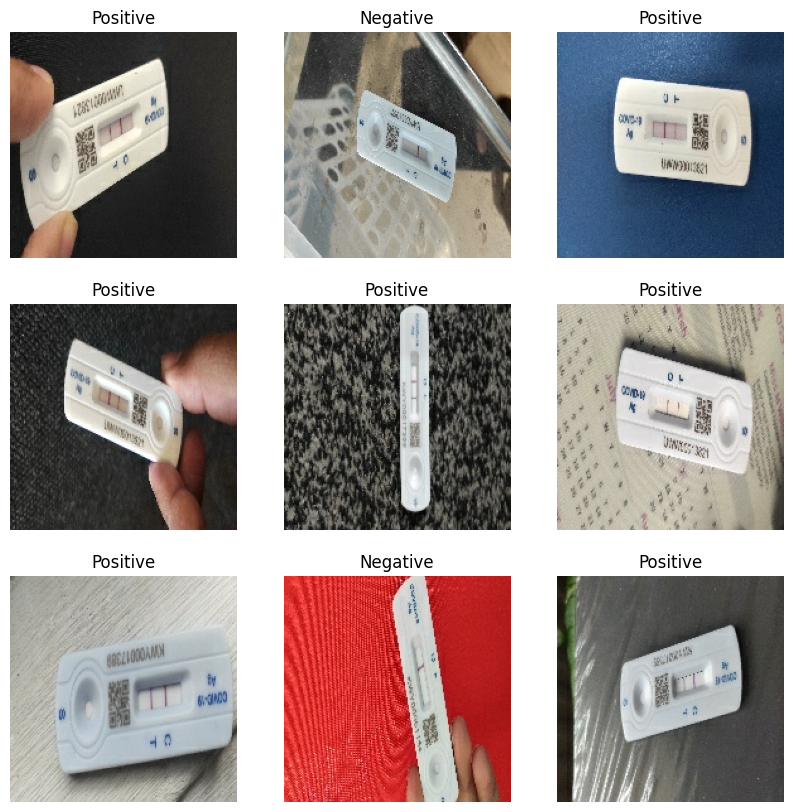

In [10]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

You will pass these datasets to the Keras `Model.fit` method for training later in this tutorial. If you like, you can also manually iterate over the dataset and retrieve batches of images:

In [11]:
for image_batch, labels_batch in train_ds:
  print(image_batch.shape)
  print(labels_batch.shape)
  break

(32, 180, 180, 3)
(32,)


The `image_batch` is a tensor of the shape `(32, 180, 180, 3)`. This is a batch of 32 images of shape `180x180x3` (the last dimension refers to color channels RGB). The `label_batch` is a tensor of the shape `(32,)`, these are corresponding labels to the 32 images.

You can call `.numpy()` on the `image_batch` and `labels_batch` tensors to convert them to a `numpy.ndarray`.


## Configure the dataset for performance

Make sure to use buffered prefetching, so you can yield data from disk without having I/O become blocking. These are two important methods you should use when loading data:

- `Dataset.cache` keeps the images in memory after they're loaded off disk during the first epoch. This will ensure the dataset does not become a bottleneck while training your model. If your dataset is too large to fit into memory, you can also use this method to create a performant on-disk cache.
- `Dataset.prefetch` overlaps data preprocessing and model execution while training.

Interested readers can learn more about both methods, as well as how to cache data to disk in the *Prefetching* section of the [Better performance with the tf.data API](../../guide/data_performance.ipynb) guide.

In [12]:
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

## Standardize the data

The RGB channel values are in the `[0, 255]` range. This is not ideal for a neural network; in general you should seek to make your input values small.

Here, you will standardize values to be in the `[0, 1]` range by using `tf.keras.layers.Rescaling`:

In [13]:
normalization_layer = layers.Rescaling(1./255)

There are two ways to use this layer. You can apply it to the dataset by calling `Dataset.map`:

In [14]:
normalized_ds = train_ds.map(lambda x, y: (normalization_layer(x), y))
image_batch, labels_batch = next(iter(normalized_ds))
first_image = image_batch[0]
# Notice the pixel values are now in `[0,1]`.
print(np.min(first_image), np.max(first_image))

0.011764707 1.0


Or, you can include the layer inside your model definition, which can simplify deployment. Use the second approach here.

Note: You previously resized images using the `image_size` argument of `tf.keras.utils.image_dataset_from_directory`. If you want to include the resizing logic in your model as well, you can use the `tf.keras.layers.Resizing` layer.

## A basic Keras model

### Create the model

The Keras [Sequential](https://www.tensorflow.org/guide/keras/sequential_model) model consists of three convolution blocks (`tf.keras.layers.Conv2D`) with a max pooling layer (`tf.keras.layers.MaxPooling2D`) in each of them. There's a fully-connected layer (`tf.keras.layers.Dense`) with 128 units on top of it that is activated by a ReLU activation function (`'relu'`). This model has not been tuned for high accuracy; the goal of this tutorial is to show a standard approach.

In [15]:
num_classes = len(class_names)

model = Sequential([
  layers.Rescaling(1./255, input_shape=(img_height, img_width, 3), name='scaling'),
  layers.Conv2D(16, 3, padding='same', activation='relu', name='conv1'),
  layers.MaxPooling2D(name='pooling1'),
  layers.Conv2D(32, 3, padding='same', activation='relu', name='conv2'),
  layers.MaxPooling2D(name='pooling2'),
  layers.Conv2D(64, 3, padding='same', activation='relu', name='conv3'),
  layers.MaxPooling2D(name='pooling3'),
  layers.Flatten(name='layers_flatten'),
  layers.Dense(128, activation='relu', name='layers_dense1'),
  layers.Dense(num_classes, name='layers_dense2')
])

### Compile the model

For this tutorial, choose the `tf.keras.optimizers.Adam` optimizer and `tf.keras.losses.SparseCategoricalCrossentropy` loss function. To view training and validation accuracy for each training epoch, pass the `metrics` argument to `Model.compile`.

In [16]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

log_dir = "/content/drive/MyDrive/MscProject/logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

### Model summary

View all the layers of the network using the Keras `Model.summary` method:

In [17]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 scaling (Rescaling)         (None, 180, 180, 3)       0         
                                                                 
 conv1 (Conv2D)              (None, 180, 180, 16)      448       
                                                                 
 pooling1 (MaxPooling2D)     (None, 90, 90, 16)        0         
                                                                 
 conv2 (Conv2D)              (None, 90, 90, 32)        4640      
                                                                 
 pooling2 (MaxPooling2D)     (None, 45, 45, 32)        0         
                                                                 
 conv3 (Conv2D)              (None, 45, 45, 64)        18496     
                                                                 
 pooling3 (MaxPooling2D)     (None, 22, 22, 64)        0

### Train the model

Train the model for 10 epochs with the Keras `Model.fit` method:

In [18]:
epochs=10
history = model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs,
  callbacks=[tensorboard_callback]
)

Epoch 1/10
7/7 [==============================] - 20s 2s/step - loss: 0.4842 - accuracy: 0.8756 - val_loss: 0.2619 - val_accuracy: 0.9615
Epoch 2/10
7/7 [==============================] - 10s 1s/step - loss: 0.3646 - accuracy: 0.8900 - val_loss: 0.1903 - val_accuracy: 0.9615
Epoch 3/10
7/7 [==============================] - 7s 1s/step - loss: 0.3120 - accuracy: 0.8900 - val_loss: 0.2679 - val_accuracy: 0.9615
Epoch 4/10
7/7 [==============================] - 8s 1s/step - loss: 0.3330 - accuracy: 0.8900 - val_loss: 0.3963 - val_accuracy: 0.9038
Epoch 5/10
7/7 [==============================] - 11s 2s/step - loss: 0.3353 - accuracy: 0.8947 - val_loss: 0.1522 - val_accuracy: 0.9615
Epoch 6/10
7/7 [==============================] - 9s 1s/step - loss: 0.2774 - accuracy: 0.9043 - val_loss: 0.2180 - val_accuracy: 0.9615
Epoch 7/10
7/7 [==============================] - 7s 1s/step - loss: 0.2723 - accuracy: 0.9091 - val_loss: 0.3088 - val_accuracy: 0.8846
Epoch 8/10
7/7 [======================

In [19]:
# Save & Define the version number
version = 1
save_model_with_version(model, version)

Model saved to /content/drive/MyDrive/MscProject/Model_V1/model.keras


## Visualize training results

Create plots of the loss and accuracy on the training and validation sets:

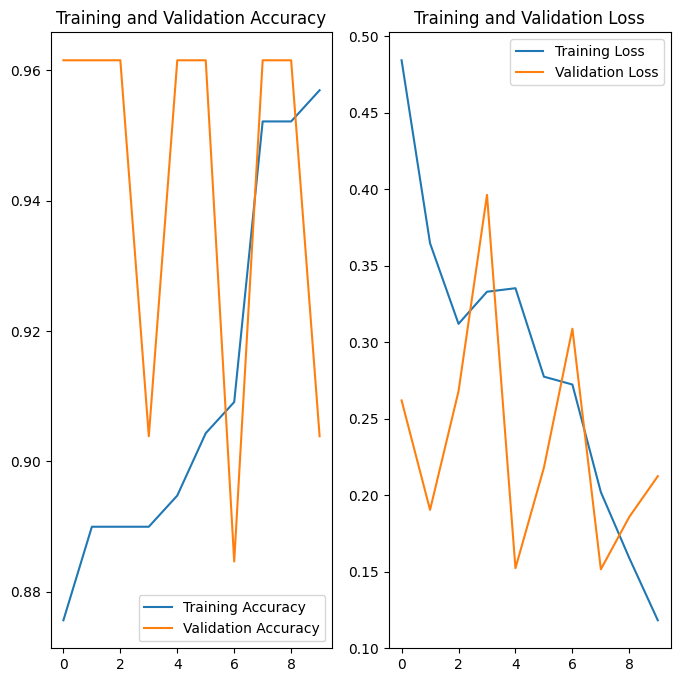

In [20]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

The plots show that training accuracy and validation accuracy are off by large margins, and the model has achieved only around 60% accuracy on the validation set.

The following tutorial sections show how to inspect what went wrong and try to increase the overall performance of the model.

In [21]:
%tensorboard --logdir drive/MyDrive/MscProject/logs/fit

<IPython.core.display.Javascript object>

1/1 [==============================] - 0s 128ms/step
This image most likely belongs to Positive with a 84.42 percent confidence.


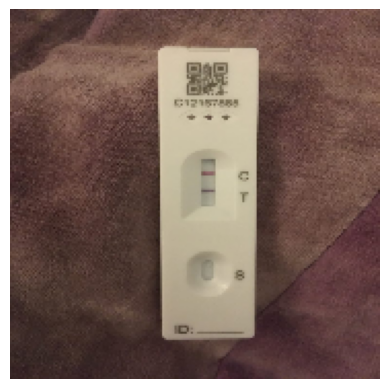

In [22]:
# Define the path to the test image
test_url = "/content/drive/MyDrive/MscProject//LFD2 768x1024.jpg"

# Load the image
img = tf.keras.utils.load_img(test_url, target_size=(img_height, img_width))
img_array = tf.keras.utils.img_to_array(img)
img_array = tf.expand_dims(img_array, 0)  # Create a batch

# Predict the class for the image
predictions = model.predict(img_array)
score = tf.nn.softmax(predictions[0])

print(
    "This image most likely belongs to {} with a {:.2f} percent confidence."
    .format(class_names[np.argmax(score)], 100 * np.max(score))
)

plt.imshow(img)
plt.axis('off')
plt.show()


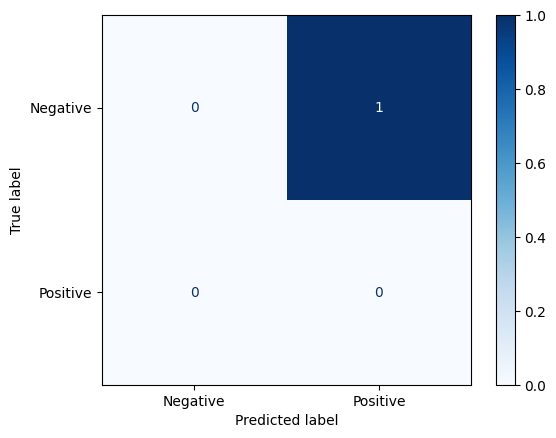

This image most likely belongs to Positive with a 84.42 percent confidence.


In [23]:
predictions_class = np.argmax(predictions, axis=1)

# 0 for Negative
y_true_class = np.array([0])

# Generate the confusion matrix
cm = confusion_matrix(y_true_class, predictions_class)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
disp.plot(cmap=plt.cm.Blues)
plt.show()

print(
    "This image most likely belongs to {} with a {:.2f} percent confidence."
    .format(class_names[np.argmax(score)], 100 * np.max(score))
)


Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 scaling_input (InputLayer)  [(None, 180, 180, 3)]     0         
                                                                 
 scaling (Rescaling)         (None, 180, 180, 3)       0         
                                                                 
 conv1 (Conv2D)              (None, 180, 180, 16)      448       
                                                                 
Total params: 448 (1.75 KB)
Trainable params: 448 (1.75 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
1/1 [==============================] - 0s 94ms/step


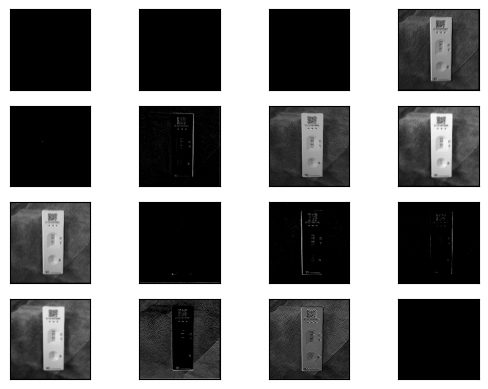

In [24]:
# Redefine the model to output right after the first hidden layer
layer_output = model.layers[1].output
model_partial = tf.keras.Model(inputs=model.inputs, outputs=layer_output)
model_partial.summary()

# Get the feature maps
feature_maps = model_partial.predict(img_array)

# Plot all feature maps in a 4x4 grid
square = 4
ix = 1
for _ in range(square):
    for _ in range(square):
        # Specify subplot and turn off axis
        ax = plt.subplot(square, square, ix)
        ax.set_xticks([])
        ax.set_yticks([])
        # Plot filter channel in grayscale
        plt.imshow(feature_maps[0, :, :, ix-1], cmap='gray')
        ix += 1
# Show the figure
plt.show()


# Retraining

In [25]:
# Reload datasets to include new images
data_dir = '/content/drive/MyDrive/MscProject/images3'

# Define dataset parameters
batch_size = 32
img_height = 180
img_width = 180

# Create training and validation datasets including new images
train_ds = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    validation_split=0.2,
    subset="training",
    seed=123,
    image_size=(img_height, img_width),
    batch_size=batch_size
)

val_ds = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    validation_split=0.2,
    subset="validation",
    seed=123,
    image_size=(img_height, img_width),
    batch_size=batch_size
)

# Load version 1 of the model into model2
version = 1
model2 = load_model_with_version(version)

# Ensure model2 is not None before continuing training
if model2 is not None:
    # Continue training model2 with more pictures
    additional_epochs = 10  # Number of additional epochs for continued training
    history2 = model2.fit(
        train_ds,
        validation_data=val_ds,
        epochs=additional_epochs
    )
else:
    print("Failed to load the model. Training cannot continue.")

Found 313 files belonging to 2 classes.
Using 251 files for training.
Found 313 files belonging to 2 classes.
Using 62 files for validation.
Model loaded from /content/drive/MyDrive/MscProject/Model_V1/model.keras
Epoch 1/10
8/8 [==============================] - 15s 1s/step - loss: 0.3340 - accuracy: 0.8685 - val_loss: 0.4453 - val_accuracy: 0.8065
Epoch 2/10
8/8 [==============================] - 9s 929ms/step - loss: 0.2345 - accuracy: 0.9163 - val_loss: 0.3112 - val_accuracy: 0.8387
Epoch 3/10
8/8 [==============================] - 11s 1s/step - loss: 0.1593 - accuracy: 0.9482 - val_loss: 0.2401 - val_accuracy: 0.9516
Epoch 4/10
8/8 [==============================] - 11s 1s/step - loss: 0.1323 - accuracy: 0.9522 - val_loss: 0.2113 - val_accuracy: 0.9355
Epoch 5/10
8/8 [==============================] - 10s 1s/step - loss: 0.0796 - accuracy: 0.9801 - val_loss: 0.2162 - val_accuracy: 0.9355
Epoch 6/10
8/8 [==============================] - 12s 1s/step - loss: 0.0567 - accuracy: 0.980

In [36]:
# Save & Define the version number
version = 2
save_model_with_version(model2, version)

Model saved to /content/drive/MyDrive/MscProject/Model_V2/model.keras


##More data better?
I have incrased the amound of negative photos and it has improved yet it is still not great.

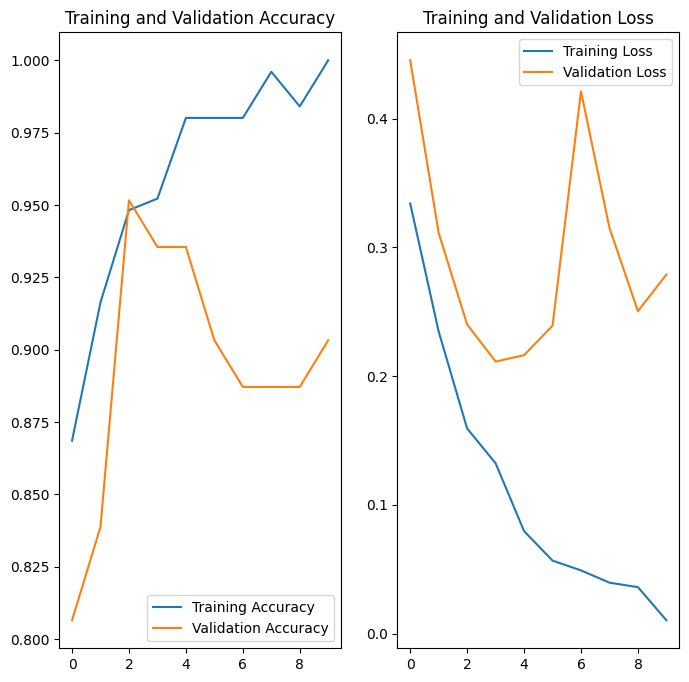

In [26]:
acc = history2.history['accuracy']
val_acc = history2.history['val_accuracy']

loss = history2.history['loss']
val_loss = history2.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

1/1 [==============================] - 0s 121ms/step
This image most likely belongs to Positive with a 84.42 percent confidence.
The model predicted incorrectly.


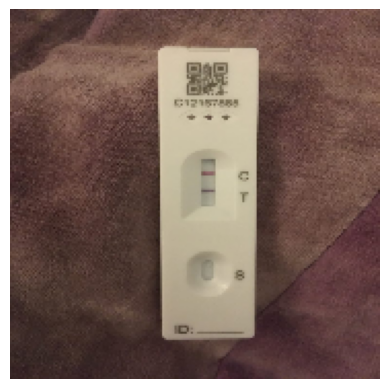

In [49]:
test_url = "/content/drive/MyDrive/MscProject/LFD2 768x1024.jpg"
actual_class = "Negative"  # Replace with the actual class of the image

img = tf.keras.utils.load_img(
    test_url, target_size=(img_height, img_width)
)
img_array = tf.keras.utils.img_to_array(img)
img_array = tf.expand_dims(img_array, 0)  # Create a batch

predictions = model.predict(img_array)
score = tf.nn.softmax(predictions[0])

predicted_class = class_names[np.argmax(score)]
confidence = 100 * np.max(score)

print(
    "This image most likely belongs to {} with a {:.2f} percent confidence."
    .format(predicted_class, confidence)
)

if predicted_class == actual_class:
    print("The model predicted correctly!")
else:
    print("The model predicted incorrectly.")

plt.imshow(img)
plt.axis("off")
plt.show()

Model: "model_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 scaling_input (InputLayer)  [(None, 180, 180, 3)]     0         
                                                                 
 scaling (Rescaling)         (None, 180, 180, 3)       0         
                                                                 
 conv1 (Conv2D)              (None, 180, 180, 16)      448       
                                                                 
 pooling1 (MaxPooling2D)     (None, 90, 90, 16)        0         
                                                                 
 conv2 (Conv2D)              (None, 90, 90, 32)        4640      
                                                                 
 pooling2 (MaxPooling2D)     (None, 45, 45, 32)        0         
                                                                 
 conv3 (Conv2D)              (None, 45, 45, 64)        1849

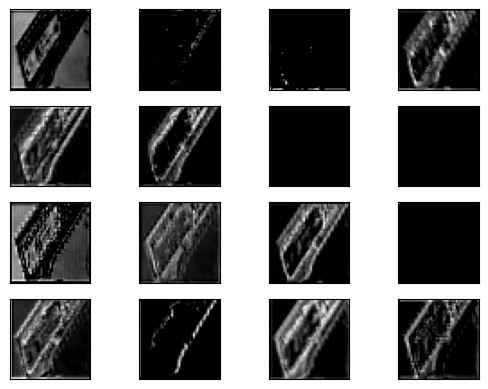

In [33]:
# Redefine the model to output right after the first hidden layer
layer_output = model2.layers[5].output
model_partial = tf.keras.Model(inputs=model2.inputs, outputs=layer_output)
model_partial.summary()

# Get the feature maps
feature_maps = model_partial.predict(img_array)

# Plot all feature maps in a 4x4 grid
square = 4
ix = 1
for _ in range(square):
    for _ in range(square):
        # Specify subplot and turn off axis
        ax = plt.subplot(square, square, ix)
        ax.set_xticks([])
        ax.set_yticks([])
        # Plot filter channel in grayscale
        plt.imshow(feature_maps[0, :, :, ix-1], cmap='gray')
        ix += 1
# Show the figure
plt.show()

# Overfitting

In the plots above, the training accuracy is increasing linearly over time, whereas validation accuracy stalls around 60% in the training process. Also, the difference in accuracy between training and validation accuracy is noticeable—a sign of [overfitting](https://www.tensorflow.org/tutorials/keras/overfit_and_underfit).

When there are a small number of training examples, the model sometimes learns from noises or unwanted details from training examples—to an extent that it negatively impacts the performance of the model on new examples. This phenomenon is known as overfitting. It means that the model will have a difficult time generalizing on a new dataset.

There are multiple ways to fight overfitting in the training process. In this tutorial, you'll use *data augmentation* and add *dropout* to your model.

Overfitting generally occurs when there are a small number of training examples. [Data augmentation](./data_augmentation.ipynb) takes the approach of generating additional training data from your existing examples by augmenting them using random transformations that yield believable-looking images. This helps expose the model to more aspects of the data and generalize better.

You will implement data augmentation using the following Keras preprocessing layers: `tf.keras.layers.RandomFlip`, `tf.keras.layers.RandomRotation`, and `tf.keras.layers.RandomZoom`. These can be included inside your model like other layers, and run on the GPU.

In [5]:
# Reload dataset
data_dir = '/content/drive/MyDrive/MscProject/images4'

# Define dataset parameters
batch_size = 32
img_height = 720
img_width = 720

# Create training and validation datasets including new images
train_ds = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    validation_split=0.2,
    subset="training",
    seed=123,
    image_size=(img_height, img_width),
    batch_size=batch_size
)

val_ds = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    validation_split=0.2,
    subset="validation",
    seed=123,
    image_size=(img_height, img_width),
    batch_size=batch_size
)

Found 311 files belonging to 2 classes.
Using 249 files for training.
Found 311 files belonging to 2 classes.
Using 62 files for validation.


In [6]:
class_names = train_ds.class_names
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

In [8]:
normalization_layer = layers.Rescaling(1./255)

normalized_ds = train_ds.map(lambda x, y: (normalization_layer(x), y))
image_batch, labels_batch = next(iter(normalized_ds))
first_image = image_batch[0]
# The pixel values are now in `[0,1]`.
print(np.min(first_image), np.max(first_image))

0.0 1.0


In [9]:
data_augmentation = keras.Sequential(
  [
    layers.RandomFlip("horizontal",
                      input_shape=(img_height,
                                  img_width,
                                  3)),
    layers.RandomRotation(0.1),
    layers.RandomZoom(0.1),
  ]
)

Visualize a few augmented examples by applying data augmentation to the same image several times:

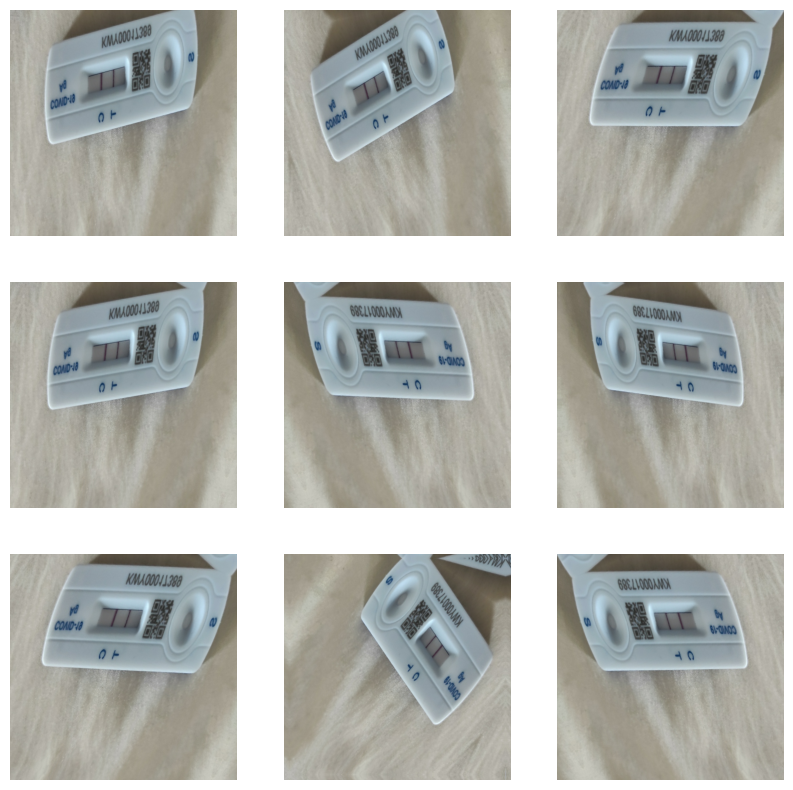

In [10]:
print(data_augmentation)
plt.figure(figsize=(10, 10))
for images, _ in train_ds.take(1):
  for i in range(9):
    augmented_images = data_augmentation(images)
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(augmented_images[0].numpy().astype("uint8"))
    plt.axis("off")

## Dropout

Another technique to reduce overfitting is to introduce [dropout](https://developers.google.com/machine-learning/glossary#dropout_regularization){:.external} regularization to the network.

When you apply dropout to a layer, it randomly drops out (by setting the activation to zero) a number of output units from the layer during the training process. Dropout takes a fractional number as its input value, in the form such as 0.1, 0.2, 0.4, etc. This means dropping out 10%, 20% or 40% of the output units randomly from the applied layer.

Create a new neural network with `tf.keras.layers.Dropout` before training it using the augmented images:

In [11]:
num_classes = len(class_names)

model3 = Sequential([
  data_augmentation,
  layers.Rescaling(1./255, input_shape=(img_height, img_width, 3), name='scaling'),
  layers.Conv2D(16, 3, padding='same', activation='relu', name='conv1'),
  layers.MaxPooling2D(name='pooling1'),
  layers.Conv2D(32, 3, padding='same', activation='relu', name='conv2'),
  layers.MaxPooling2D(name='pooling2'),
  layers.Conv2D(64, 3, padding='same', activation='relu', name='conv3'),
  layers.MaxPooling2D(name='pooling3'),
  layers.Flatten(name='layers_flatten'),
  layers.Dropout(0.2, name='dropout1'),
  layers.Dense(128, activation='relu', name='layers_dense1'),
  layers.Dense(num_classes, name='layers_dense2')
])

## Compile and train the model

In [12]:
model3.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [13]:
model3.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential (Sequential)     (None, 720, 720, 3)       0         
                                                                 
 scaling (Rescaling)         (None, 720, 720, 3)       0         
                                                                 
 conv1 (Conv2D)              (None, 720, 720, 16)      448       
                                                                 
 pooling1 (MaxPooling2D)     (None, 360, 360, 16)      0         
                                                                 
 conv2 (Conv2D)              (None, 360, 360, 32)      4640      
                                                                 
 pooling2 (MaxPooling2D)     (None, 180, 180, 32)      0         
                                                                 
 conv3 (Conv2D)              (None, 180, 180, 64)     

In [ ]:
epochs = 20
history3 = model3.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs
)

Epoch 1/20
8/8 [==============================] - 188s 23s/step - loss: 15.9568 - accuracy: 0.6466 - val_loss: 0.6357 - val_accuracy: 0.6935
Epoch 2/20
8/8 [==============================] - 179s 23s/step - loss: 0.5642 - accuracy: 0.7751 - val_loss: 0.6297 - val_accuracy: 0.6935
Epoch 3/20
8/8 [==============================] - 189s 25s/step - loss: 0.5675 - accuracy: 0.7751 - val_loss: 0.6027 - val_accuracy: 0.6935
Epoch 4/20
8/8 [==============================] - 179s 23s/step - loss: 0.5610 - accuracy: 0.7751 - val_loss: 0.6330 - val_accuracy: 0.6935
Epoch 5/20
8/8 [==============================] - 178s 22s/step - loss: 0.5463 - accuracy: 0.7751 - val_loss: 0.5963 - val_accuracy: 0.6935
Epoch 6/20
8/8 [==============================] - 172s 22s/step - loss: 0.5506 - accuracy: 0.7751 - val_loss: 0.6220 - val_accuracy: 0.6935
Epoch 7/20
8/8 [==============================] - 184s 22s/step - loss: 0.5484 - accuracy: 0.7751 - val_loss: 0.5953 - val_accuracy: 0.6935
Epoch 8/20
8/8 [===

In [41]:
# Save & Define the version number
version = 3
save_model_with_version(model3, version)

Model saved to /content/drive/MyDrive/MscProject/Model_V3/model.keras


## Visualize training results

After applying data augmentation and `tf.keras.layers.Dropout`, there is less overfitting than before, and training and validation accuracy are closer aligned:

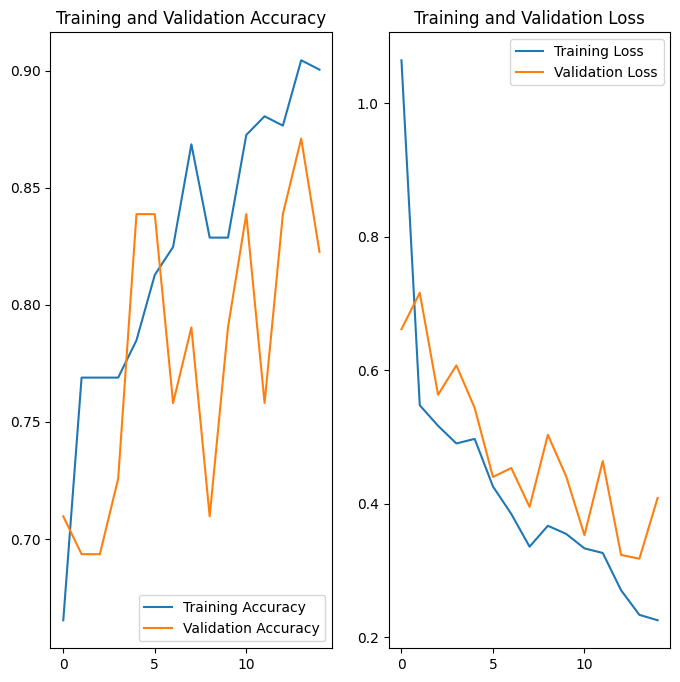

In [43]:
acc = history3.history['accuracy']
val_acc = history3.history['val_accuracy']

loss = history3.history['loss']
val_loss = history3.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

## Predict on new data

Use your model to classify an image that wasn't included in the training or validation sets.

Note: Data augmentation and dropout layers are inactive at inference time.

1/1 [==============================] - 0s 107ms/step
This image most likely belongs to Positive with a 99.97 percent confidence.
The model predicted incorrectly.


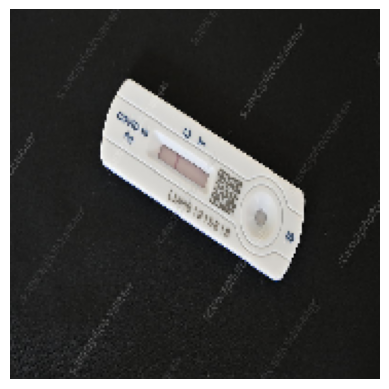

In [50]:
test_url = "/content/drive/MyDrive/MscProject/Negative lateral flow test for Covid-19.jpg"
actual_class = "Negative"  # Replace with the actual class of the image

img = tf.keras.utils.load_img(
    test_url, target_size=(img_height, img_width)
)
img_array = tf.keras.utils.img_to_array(img)
img_array = tf.expand_dims(img_array, 0)  # Create a batch

predictions = model3.predict(img_array)
score = tf.nn.softmax(predictions[0])

predicted_class = class_names[np.argmax(score)]
confidence = 100 * np.max(score)

print(
    "This image most likely belongs to {} with a {:.2f} percent confidence."
    .format(predicted_class, confidence)
)

if predicted_class == actual_class:
    print("The model predicted correctly!")
else:
    print("The model predicted incorrectly.")

plt.imshow(img)
plt.axis("off")
plt.show()

## Use TensorFlow Lite

TensorFlow Lite is a set of tools that enables on-device machine learning by helping developers run their models on mobile, embedded, and edge devices.

### Convert the Keras Sequential model to a TensorFlow Lite model

To use the trained model with on-device applications, first [convert it](https://www.tensorflow.org/lite/models/convert) to a smaller and more efficient model format called a [TensorFlow Lite](https://www.tensorflow.org/lite/) model.

In this example, take the trained Keras Sequential model and use `tf.lite.TFLiteConverter.from_keras_model` to generate a [TensorFlow Lite](https://www.tensorflow.org/lite/) model:

In [ ]:
# Convert the model.
converter = tf.lite.TFLiteConverter.from_keras_model(model)
tflite_model = converter.convert()

# Save the model.
with open('model.tflite', 'wb') as f:
  f.write(tflite_model)

The TensorFlow Lite model you saved in the previous step can contain several function signatures. The Keras model converter API uses the default signature automatically. Learn more about [TensorFlow Lite signatures](https://www.tensorflow.org/lite/guide/signatures).

### Run the TensorFlow Lite model

You can access the TensorFlow Lite saved model signatures in Python via the `tf.lite.Interpreter` class.

Load the model with the `Interpreter`:

In [ ]:
TF_MODEL_FILE_PATH = 'model.tflite' # The default path to the saved TensorFlow Lite model

interpreter = tf.lite.Interpreter(model_path=TF_MODEL_FILE_PATH)

Print the signatures from the converted model to obtain the names of the inputs (and outputs):


In [ ]:
interpreter.get_signature_list()

In this example, you have one default signature called `serving_default`. In addition, the name of the `'inputs'` is `'sequential_1_input'`, while the `'outputs'` are called `'outputs'`. You can look up these first and last Keras layer names when running `Model.summary`, as demonstrated earlier in this tutorial.

Now you can test the loaded TensorFlow Model by performing inference on a sample image with `tf.lite.Interpreter.get_signature_runner` by passing the signature name as follows:

In [ ]:
classify_lite = interpreter.get_signature_runner('serving_default')
classify_lite

Similar to what you did earlier in the tutorial, you can use the TensorFlow Lite model to classify images that weren't included in the training or validation sets.

You have already tensorized that image and saved it as `img_array`. Now, pass it to the first argument (the name of the `'inputs'`) of the loaded TensorFlow Lite model (`predictions_lite`), compute softmax activations, and then print the prediction for the class with the highest computed probability.

In [ ]:
predictions_lite = classify_lite(sequential_4_input=img_array)['outputs']
score_lite = tf.nn.softmax(predictions_lite)

In [ ]:
print(
    "This image most likely belongs to {} with a {:.2f} percent confidence."
    .format(class_names[np.argmax(score_lite)], 100 * np.max(score_lite))
)

The prediction generated by the lite model should be almost identical to the predictions generated by the original model:

In [ ]:
print(np.max(np.abs(predictions - predictions_lite)))

Of the five classes—`'daisy'`, `'dandelion'`, `'roses'`, `'sunflowers'`, and `'tulips'`—the model should predict the image belongs to sunflowers, which is the same result as before the TensorFlow Lite conversion.
